# Project

    Name: Khushi Gandhi
    USC ID: 6401790989
    USC E-mail: kjgandhi@usc.edu
    Major: Master of Science in Applied Data Science

## Index

* [1. Reading and Loading the chosen dataset (diamonds.csv)](#sec1)
    * [1.1 Reading and Loading the Dataset](#sec11)
    * [1.2 Cleaning the Dataset](#sec12)
        * [1.2.1 Checking for missing values](#sec121)
        * [1.2.2 Label Encoding](#sec122)
        * [1.2.3 Handling Missing Values](#sec123)
        * [1.2.4 Dropping Duplicates](#sec124)
        * [1.2.5 Removing Outliers](#sec125)
* [2. Performing exploratory data analysis (EDA) on the variables and generating statistical summaries and visualizations to gain insights into the data.](#sec2)
    * [2.1 Numerical Summary](#sec21)
        * [2.1.1 Dataset before cleaning](#sec211)
        * [2.1.2 Dataset after cleaning](#sec212)
    * [2.2 Categorical Summary](#sec22)
        * [2.2.1 Dataset before cleaning](#sec221)
        * [2.2.2 Dataset after cleaning](#sec222)
    * [2.3 Graphical Representation](#sec23)
        * [2.3.1 Histograms](#sec231)
        * [2.3.2 Boxplots](#sec232)
        * [2.3.3 Correlation Matrix](#sec233)
        * [2.3.4 Pair Plot](#sec234)
        * [2.3.5 Lag Plots](#sec235)
        * [2.3.6 QQ Plots](#sec236)
* [3. Implementing Regression Models along with the evaluation metrics (R² and MSE)](#sec3)
    * [3.1 Feature Selection Methods](#sec31)
        * [3.1.1 Correlation](#sec311)
        * [3.1.2 ANOVA](#sec312)
        * [3.1.3 Forward Selection](#sec313)
        * [3.1.4 Backward Selection](#sec314)
    * [3.2 Linear Regression](#sec32)
        * [3.2.1 Simple Linear Regression](#sec321)
        * [3.2.2 Multiple Linear (Polynomial) Regression](#sec322)
    * [3.3 Decision Tree Regressor](#sec33)
    * [3.4 Random Forest Regressor](#sec34)
    * [3.5 Regularization Methods](#sec35)
        * [3.5.1 L-1 Regularization (Lasso)](#sec351)
        * [3.5.2 L-2 Regularization (Ridge)](#sec352)
    * [3.6 Neural Networks](#sec36)
        * [3.6.1 Multi-Layer Perceptron Regressor](#sec361)

In [1]:
# importing packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import warnings 
warnings.filterwarnings('ignore')

In [2]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV 
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
import statsmodels.api as sm

## 1. Reading and Loading the chosen dataset (diamonds.csv) <a class="anchor" id="sec1"></a>

### 1.1 Reading and Loading the Dataset <a class="anchor" id="sec11"></a>

In [3]:
# original dataset
df = pd.read_csv("diamonds.csv")

In [4]:
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


### 1.2 Cleaning the Dataset <a class="anchor" id="sec12"></a>

In [5]:
# making a copy to compare the cleaned dataset with the original dataset
diamonds = pd.read_csv("diamonds.csv")

#### 1.2.1 Checking for missing values <a class="anchor" id="sec121"></a>

In [6]:
missing = diamonds.isnull().sum()
print("Missing values in each column:")
print(missing.to_dict())

Missing values in each column:
{'carat': 0, 'cut': 0, 'color': 0, 'clarity': 0, 'depth': 0, 'table': 0, 'price': 0, 'x': 0, 'y': 0, 'z': 0}


#### 1.2.2 Label Encoding <a class="anchor" id="sec122"></a>

In [7]:
LE = LabelEncoder()

diamonds['cut'] = LE.fit_transform(diamonds['cut'])
diamonds['color'] = LE.fit_transform(diamonds['color'])
diamonds['clarity'] = LE.fit_transform(diamonds['clarity'])

#### 1.2.3 Handling Missing Values <a class="anchor" id="sec123"></a>

In [8]:
diamonds = diamonds.fillna(0)

#### 1.2.4 Dropping Duplicates <a class="anchor" id="sec124"></a>

In [9]:
diamonds = diamonds.drop_duplicates()

#### 1.2.5 Removing Outliers <a class="anchor" id="sec125"></a>

In [10]:
for col in diamonds.columns:
    if col not in ['cut', 'color', 'clarity']:
        Q1 = diamonds[col].quantile(0.25)
        Q3 = diamonds[col].quantile(0.75)
        IQR = Q3 - Q1
        LB = Q1 - 1.5 * IQR
        UB = Q3 + 1.5 * IQR
        diamonds = diamonds[(diamonds[col] >= LB) & (diamonds[col] <= UB)]

## 2. Performing exploratory data analysis (EDA) on the variables and generating statistical summaries and visualizations to gain insights into the data. <a class="anchor" id="sec2"></a>

### 2.1 Numerical Summary <a class="anchor" id="sec21"></a>

#### 2.1.1 Dataset before cleaning <a class="anchor" id="sec211"></a>

In [11]:
df.describe(include='all')

,carat,cut,color,clarity,depth,table,price,x,y,z
count,53940.000000,53940,53940,53940,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
unique,NaN,5,7,8,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Ideal,G,SI1,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,21551,11292,13065,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.797940,NaN,NaN,NaN,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,NaN,NaN,NaN,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,NaN,NaN,NaN,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,NaN,NaN,NaN,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,NaN,NaN,NaN,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,NaN,NaN,NaN,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000


#### 2.1.2 Dataset after cleaning <a class="anchor" id="sec212"></a>

In [12]:
diamonds.describe()

,carat,cut,color,clarity,depth,table,price,x,y,z
count,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000
mean,0.698218,2.624211,2.535401,3.886807,61.803673,57.239968,3001.342768,5.522105,5.527182,3.414310
std,0.361951,0.943223,1.685153,1.729550,1.077656,2.013965,2599.798006,0.964303,0.958496,0.597123
min,0.200000,0.000000,0.000000,0.000000,59.000000,52.000000,326.000000,3.730000,3.680000,1.410000
25%,0.370000,2.000000,1.000000,2.000000,61.200000,56.000000,881.000000,4.630000,4.630000,2.850000
50%,0.590000,2.000000,3.000000,4.000000,61.900000,57.000000,2007.000000,5.400000,5.410000,3.330000
75%,1.010000,3.000000,4.000000,5.000000,62.500000,59.000000,4524.000000,6.390000,6.390000,3.960000
max,2.000000,4.000000,6.000000,7.000000,64.600000,63.500000,11047.000000,8.270000,8.270000,5.080000


#### _The numerical summary highlights the data cleaning process effectively removes outliers and reduced variability in the dataset, leading to more consistent and reliable summary statistics. This cleaned dataset is likely to yield more accurate and meaningful insights during further analysis._

### 2.2 Categorical Summary <a class="anchor" id="sec22"></a>

#### 2.2.1 Dataset before cleaning <a class="anchor" id="sec221"></a>

In [13]:
df.astype('object').describe()

,carat,cut,color,clarity,depth,table,price,x,y,z
count,53940.0,53940,53940,53940,53940.0,53940.0,53940,53940.00,53940.00,53940.0
unique,273.0,5,7,8,184.0,127.0,11602,554.00,552.00,375.0
top,0.3,Ideal,G,SI1,62.0,56.0,605,4.37,4.34,2.7
freq,2604.0,21551,11292,13065,2239.0,9881.0,132,448.00,437.00,767.0


#### 2.2.2 Dataset after cleaning <a class="anchor" id="sec222"></a>

In [14]:
diamonds.astype('object').describe()

,carat,cut,color,clarity,depth,table,price,x,y,z
count,46425.0,46425,46425,46425,46425.0,46425.0,46425,46425.00,46425.00,46425.0
unique,175.0,5,7,8,57.0,104.0,8501,435.00,432.00,285.0
top,0.3,2,3,2,62.0,56.0,605,4.37,4.34,2.7
freq,2547.0,20037,9844,11245,2058.0,9084.0,131,439.00,435.00,757.0


#### _The categorical summary highlights the effectiveness of the data cleaning process. There are fewer entries, less variability, and a more uniform representation of categorical variables in the cleaned dataset. These changes likely contribute to more reliable and accurate analyses. The central tendencies remain consistent, indicating that the core characteristics of the data have been preserved despite the cleaning process._

### 2.3 Graphical Representation <a class="anchor" id="sec23"></a>

#### 2.3.1 Histograms <a class="anchor" id="sec231"></a>

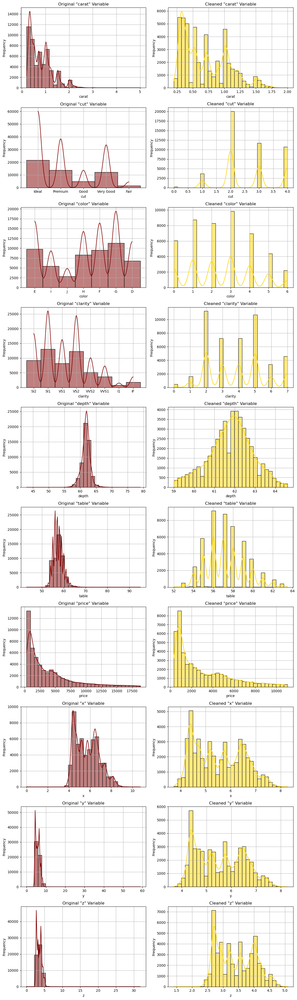

In [15]:
num = len(df.columns)
fig, axes = plt.subplots(nrows=num, ncols=2, figsize=(12, 4 * num))

for i, col in enumerate(df.columns):
    sns.histplot(df[col], bins=30, kde=True, ax=axes[i, 0], color='maroon', edgecolor='black')
    axes[i, 0].set_title(f'Original "{col}" Variable')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel('Frequency')
    axes[i, 0].grid(True)
    
    sns.histplot(diamonds[col], bins=30, kde=True, ax=axes[i, 1], color='gold', edgecolor='black')
    axes[i, 1].set_title(f'Cleaned "{col}" Variable')
    axes[i, 1].set_xlabel(col)
    axes[i, 1].set_ylabel('Frequency')
    axes[i, 1].grid(True)

plt.tight_layout()
plt.show()

#### _These visualizations help to understand the frequency and spread of these variables before and after data cleaning. The histograms highlight the distribution of key diamond features before and after data cleaning. The cleaned data has more refined, balanced, and standardized distributions, indicating a thorough cleaning process that increased data quality. This analysis emphasizes the significance of data cleaning in producing accurate and dependable results._

#### 2.3.2 Boxplots <a class="anchor" id="sec232"></a>

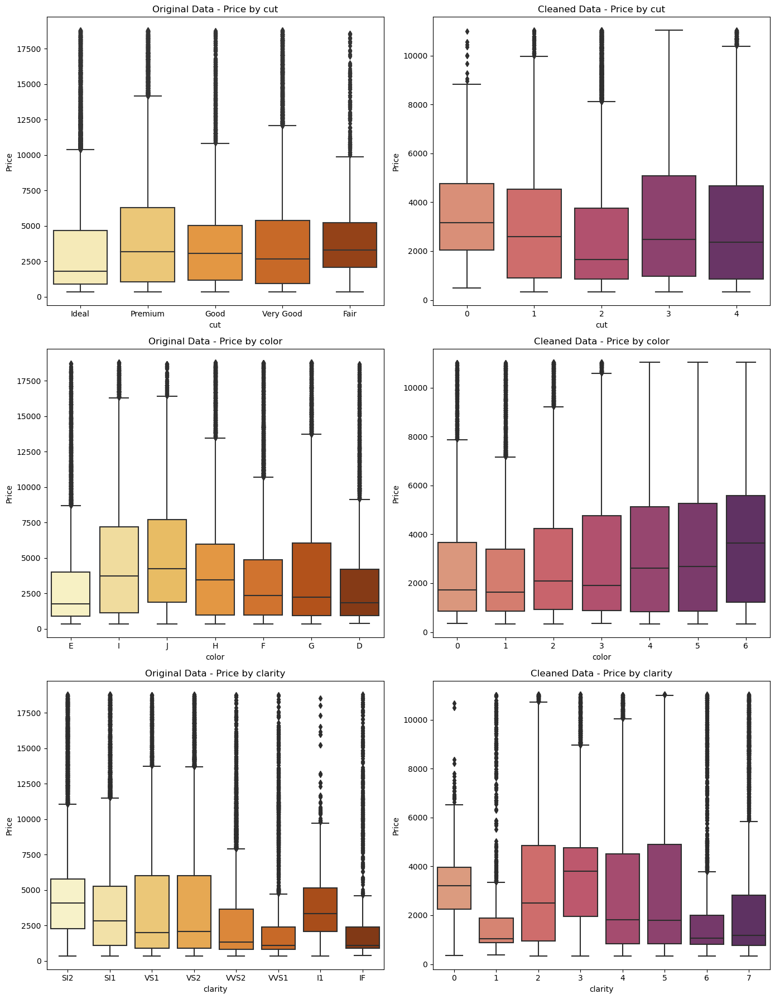

In [16]:
categories = ['cut', 'color', 'clarity']
fig, axes = plt.subplots(nrows=len(categories), ncols=2, figsize=(14, 6 * len(categories)))

for i, col in enumerate(categories):
    sns.boxplot(x=col, y='price', data=df, palette="YlOrBr", ax=axes[i, 0])
    axes[i, 0].set_title(f'Original Data - Price by {col}')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel('Price')
    
    sns.boxplot(x=col, y='price', data=diamonds, palette="flare", ax=axes[i, 1])
    axes[i, 1].set_title(f'Cleaned Data - Price by {col}')
    axes[i, 1].set_xlabel(col)
    axes[i, 1].set_ylabel('Price')

plt.tight_layout()
plt.show()

#### _These visualizations help to understand how these factors influence diamond pricing. The box plots for both the original and cleaned data show that cut, color, and clarity have a considerable impact on diamond prices. The cleaned data offers a more refined and consistent view, with fewer outliers and clearer trends. This analysis emphasizes the significance of data cleaning in increasing the reliability and understanding of the results._

#### 2.3.3 Correlation Matrix <a class="anchor" id="sec233"></a>

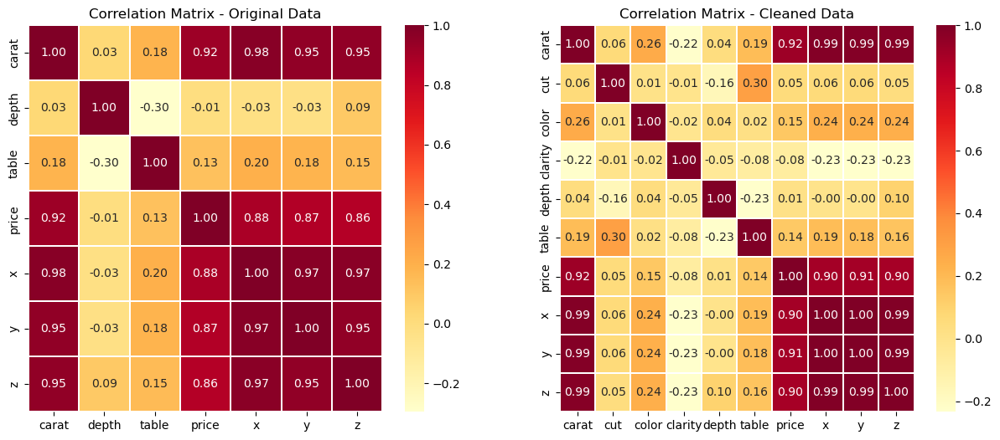

In [17]:
ogmatrix = df.corr()
cleanmatrix = diamonds.corr()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

sns.heatmap(ogmatrix, cmap='YlOrRd', linewidths=0.2, annot=True, fmt='.2f', ax=axes[0])
axes[0].set_title('Correlation Matrix - Original Data')

sns.heatmap(cleanmatrix, cmap='YlOrRd', linewidths=0.2, annot=True, fmt='.2f', ax=axes[1])
axes[1].set_title('Correlation Matrix - Cleaned Data')

plt.show()

#### _High positive values indicate strong positive correlations, while high negative values indicate strong negative correlations. Values close to zero suggest weak or no correlation. The correlation matrices demonstrate the key elements impacting diamond pricing. Both original and cleaned data indicate that carat size and dimensions (x, y, z) are the key price factors. The cleaned data provides a more detailed view, including categorical variables that, while less significant, provide a more nuanced knowledge of diamond quality factors such as cut, color, and clarity._

#### 2.3.4  Pair Plot <a class="anchor" id="sec234"></a>

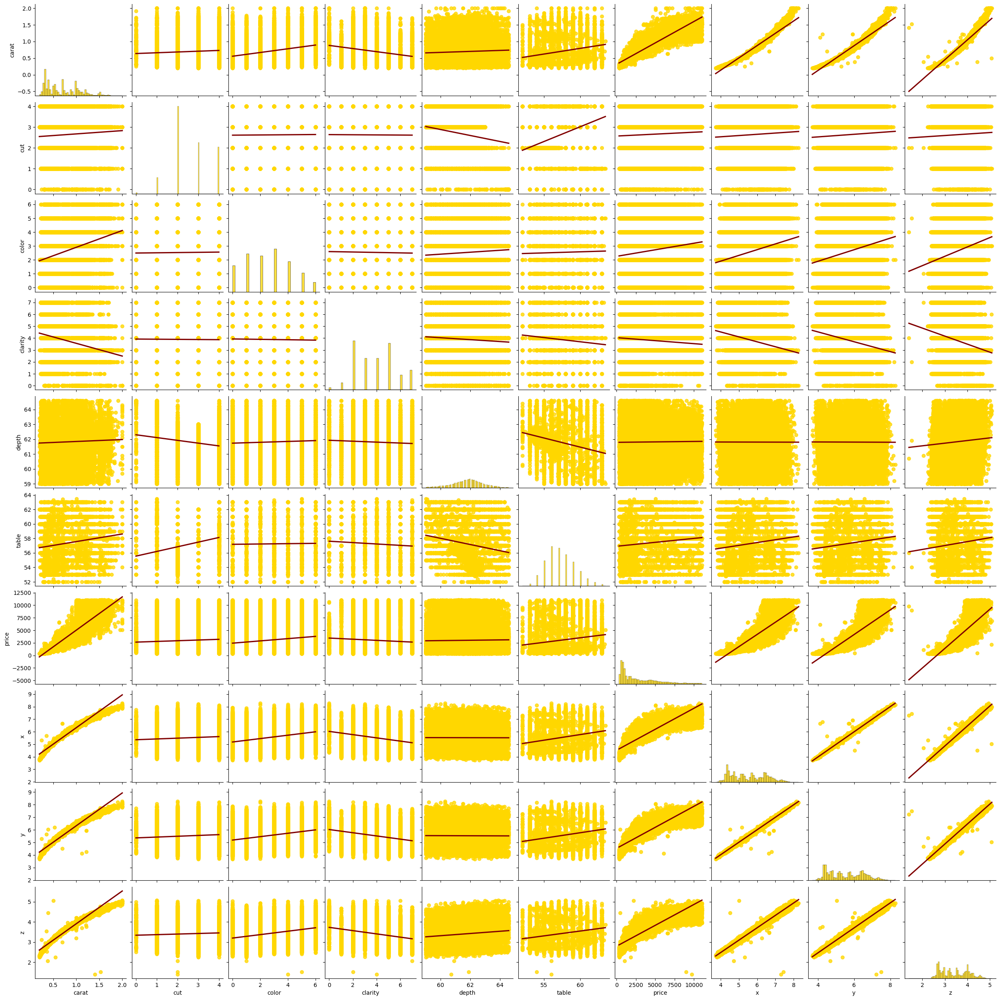

In [18]:
sns.pairplot(
    diamonds,
    kind='reg',
    plot_kws={'scatter_kws': {'color': 'gold'}, 'line_kws': {'color': 'maroon'}},
    diag_kind='hist',
    diag_kws={'color': 'gold'}
)
plt.show()

#### _Pair plots provide a visual overview of the relationships between variables, highlighting potential linear or non-linear relationships. The scatter plots indicate that carat, x, y, and z have a strong linear relationship with price, while other variables show weaker relationships. The cleaned data's pair plots have reduced noise and clearer trends, aiding in better model interpretation and accuracy._

#### 2.3.5  Lag Plots <a class="anchor" id="sec235"></a>

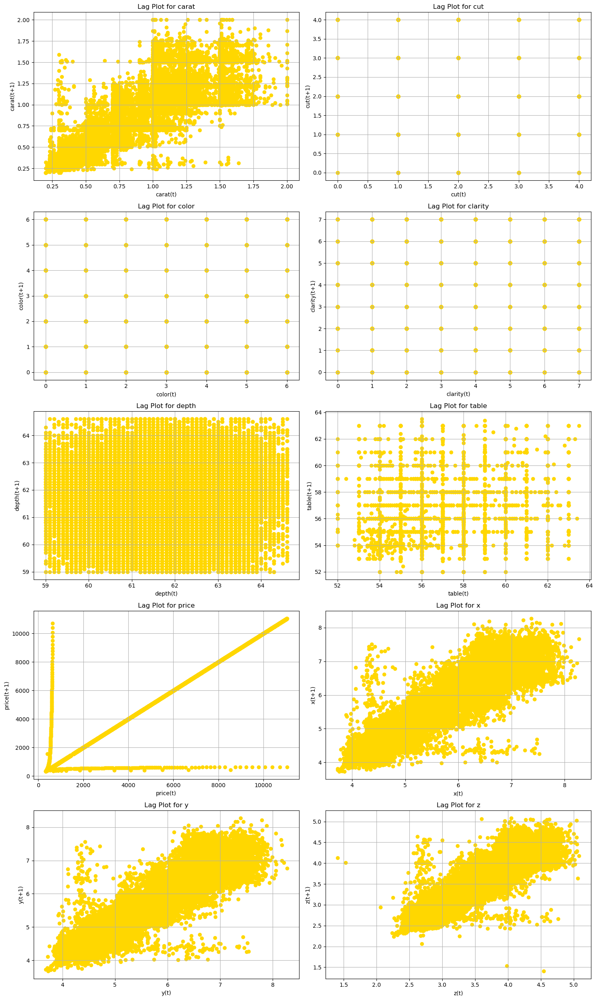

In [19]:
columns = diamonds.select_dtypes(include=[np.number]).columns
num = len(columns)
rows = (num + 1) // 2
fig, axes = plt.subplots(rows, 2, figsize=(15, 5*rows))
axes = axes.flatten()

for i, col in enumerate(columns):
    axes[i].scatter(diamonds[col][:-1], diamonds[col][1:], color='gold')
    axes[i].set_title(f'Lag Plot for {col}')
    axes[i].set_xlabel(f'{col}(t)')
    axes[i].set_ylabel(f'{col}(t+1)')
    axes[i].grid(True)

plt.tight_layout()
plt.show()

#### _Lag plots for numerical variables in the cleaned dataset show that there is no significant autocorrelation, indicating that the observations are independent of each other. This lack of autocorrelation supports the use of standard regression models without needing to account for time-series dependencies._

#### 2.3.6  QQ Plots <a class="anchor" id="sec236"></a>

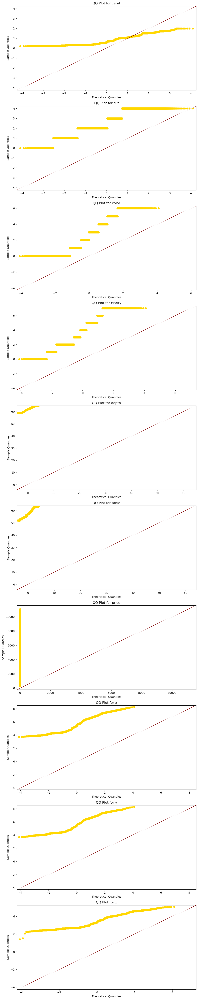

In [20]:
columns = diamonds.select_dtypes(include=[np.number]).columns
num = len(columns)
fig, axes = plt.subplots(num, 1, figsize=(10, 5*num))
for i, col in enumerate(columns):
    qq = sm.qqplot(diamonds[col], line='45', ax=axes[i])
    axes[i].get_lines()[1].set_color('maroon')  
    axes[i].get_lines()[1].set_linestyle('--')   
    axes[i].get_lines()[0].set_markerfacecolor('gold')  
    axes[i].get_lines()[0].set_markeredgecolor('gold')  
    axes[i].set_title(f'QQ Plot for {col}')
    
plt.tight_layout()
plt.show()

#### _The QQ plots for numerical variables in the cleaned dataset indicate that the data follows a normal distribution reasonably well, with some deviations at the tails. This normality assumption supports the application of linear regression models, which rely on the normality of residuals for valid inference. Deviations from the diagonal line indicate departures from normality._

## 3. Implementing Regression Models along with the evaluation metrics (R² and MSE) <a class="anchor" id="sec3"></a>

### 3.1 Feature Selection Methods <a class="anchor" id="sec31"></a>

#### 3.1.1 Correlation <a class="anchor" id="sec311"></a>

In [21]:
# Correlation

X = diamonds.drop(['price'],axis=1)
y = diamonds['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [22]:
# Method 1: Filter Method using Correlation Coefficient
correlations = X_train.corrwith(y_train)
print("Correlation Coefficients:\n", correlations)

Correlation Coefficients:
 carat      0.925638
cut        0.050200
color      0.147240
clarity   -0.075133
depth      0.017376
table      0.137119
x          0.904672
y          0.905684
z          0.901791
dtype: float64


In [23]:
thresholds = [0.1, 0.2, 0.3]
features = []

for t in thresholds:
    featcorr = correlations[abs(correlations) > t].index.tolist()
    features.append({'threshold': t, 'features': featcorr})
featuresDF = pd.DataFrame(features)
print("Selected Features by Thresholds:\n")
featuresDF

Selected Features by Thresholds:



,threshold,features
0,0.1,"[carat, color, table, x, y, z]"
1,0.2,"[carat, x, y, z]"
2,0.3,"[carat, x, y, z]"


#### 3.1.2 ANOVA <a class="anchor" id="sec312"></a>

In [24]:
# ANOVA

# Define features and target variable
X = diamonds.drop('price', axis=1)
y = diamonds['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X_train, y_train)

featscores = selector.scores_
fscores = pd.DataFrame({'Feature': X_train.columns, 'Score': featscores})
fscores = fscores.sort_values(by='Score', ascending=False)

print("ANOVA Feature Scores:\n", fscores)

k = 5  # Select top 5 features
selector = SelectKBest(score_func=f_classif, k=k)
train_selected = selector.fit_transform(X_train, y_train)
test_selected = selector.transform(X_test)

# Display the selected features
featanova = X_train.columns[selector.get_support()]
featanova = featanova.tolist()
print("Selected Features:", featanova) 

ANOVA Feature Scores:
    Feature      Score
7        y  90.705688
6        x  88.647026
8        z  82.234224
0    carat  75.653125
3  clarity   2.296477
2    color   2.285553
5    table   1.375287
1      cut   1.267444
4    depth   1.215423
Selected Features: ['carat', 'clarity', 'x', 'y', 'z']


In [25]:
R2scores = []
selected = []

for k in range(5, 10):
    selector = SelectKBest(score_func=f_classif, k=k)
    train_selected = selector.fit_transform(X_train, y_train)
    test_selected = selector.transform(X_test)
    
    model = LinearRegression()
    model.fit(train_selected, y_train)
    
    #predict and calculate R-squared for the model
    y_pred = model.predict(test_selected)
    r2 = r2_score(y_test, y_pred)
    
    selected = X.columns[selector.get_support()]
    selected = selected.tolist()
    # append the R-squared score
    R2scores.append((k, r2, selected))

In [26]:
R2DF = pd.DataFrame(R2scores, columns=['K', 'R-squared', 'Selected features'])
R2DF

,K,R-squared,Selected features
0,5,0.874028,"[carat, clarity, x, y, z]"
1,6,0.887211,"[carat, color, clarity, x, y, z]"
2,7,0.888665,"[carat, color, clarity, table, x, y, z]"
3,8,0.888674,"[carat, cut, color, clarity, table, x, y, z]"
4,9,0.888652,"[carat, cut, color, clarity, depth, table, x, ..."


In [27]:
# show which value of K gives the best R-squared value
bestK = R2DF.loc[R2DF['R-squared'].idxmax()]['K']
print('The best value of K is:', bestK)

The best value of K is: 8


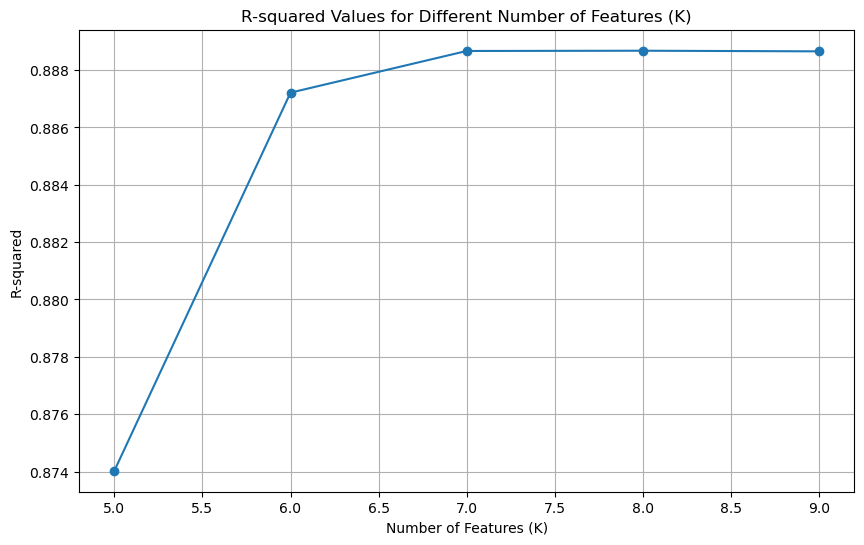

In [28]:
plt.figure(figsize=(10, 6))
plt.plot(R2DF['K'], R2DF['R-squared'], marker='o')
plt.xlabel('Number of Features (K)')
plt.ylabel('R-squared')
plt.title('R-squared Values for Different Number of Features (K)')
plt.grid(True)
plt.show()

#### 3.1.3 Forward Selection <a class="anchor" id="sec313"></a>

In [29]:
# Wrapper Method using Forward selection

X = diamonds.drop('price', axis=1)
y = diamonds['price']

# Split the diamonds into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to perform forward selection
def forward(X, y, significance=0.05):
    initial = X.columns.tolist()
    bestfeat = []
    while len(initial) > 0:
        remaining = list(set(initial) - set(bestfeat))
        pval = pd.Series(index=remaining)
        for r in remaining:
            model = sm.OLS(y, sm.add_constant(X[bestfeat + [r]])).fit()
            pval[r] = model.pvalues[r]
        minpval = pval.min()
        if minpval < significance:
            bestfeat.append(pval.idxmin())
        else:
            break
    return bestfeat

In [30]:
# Perform forward selection
featforward = forward(X_train, y_train)
print("Selected Features:", featforward)

Selected Features: ['y', 'carat', 'color', 'clarity', 'z', 'table', 'x', 'depth']


#### 3.1.4 Backward Selection <a class="anchor" id="sec314"></a>

In [31]:
# Wrapper Method using Backward selection

def backward(X, y, significance=0.05):
    features = X.columns.tolist()
    while len(features) > 0:
        const = sm.add_constant(X[features])
        model = sm.OLS(y, const).fit()  
        maxpval = model.pvalues.drop('const').max()
        if maxpval >= significance:
            removed = model.pvalues.drop('const').idxmax()
            features.remove(removed)
        else:
            break
    return features

In [32]:
# Perform backward selection
featbackward = backward(X_train, y_train)
print("Selected Features (Backward):", featbackward)

Selected Features (Backward): ['carat', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z']


In [33]:
# Initialize models
models = {
    "Correlation": LinearRegression(),
    "ANOVA": LinearRegression(),
    "Forward": LinearRegression(),
    "Backward": LinearRegression()
}

# Selected features
selected = {
    "Correlation": featcorr,
    "ANOVA": featanova,
    "Forward": featforward,
    "Backward": featbackward
}

results = {}
for method, features in selected.items():
    model = models[method]
    model.fit(X_train[features], y_train)
    
    # Predictions
    trainpred = model.predict(X_train[features])
    testpred = model.predict(X_test[features])
    
    # Training metrics
    trainMSE = mean_squared_error(y_train, trainpred)
    trainR2 = r2_score(y_train, trainpred)
    
    # Test metrics
    testMSE = mean_squared_error(y_test, testpred)
    testR2 = r2_score(y_test, testpred)
    
    # Store results
    results[method] = {
        "Train R2": trainR2,
        "Train MSE": trainMSE,
        "Test R2": testR2,
        "Test MSE": testMSE
    }

# Print results
for method, metrics in results.items():
    print(f"Method: {method}")
    print(f"Train R²: {metrics['Train R2']:.4f}")
    print(f"Train MSE: {metrics['Train MSE']:.4f}")
    print(f"Test R²: {metrics['Test R2']:.4f}")
    print(f"Test MSE: {metrics['Test MSE']:.4f}")
    print(f"Difference between Train R² and Test R²: {(metrics['Train R2']-metrics['Test R2']):.4f}")
    print()


Method: Correlation
Train R²: 0.8616
Train MSE: 937728.7981
Test R²: 0.8565
Test MSE: 961577.3197
Difference between Train R² and Test R²: 0.0051

Method: ANOVA
Train R²: 0.8780
Train MSE: 826392.1928
Test R²: 0.8740
Test MSE: 843910.8914
Difference between Train R² and Test R²: 0.0040

Method: Forward
Train R²: 0.8919
Train MSE: 732539.3040
Test R²: 0.8886
Test MSE: 746006.8115
Difference between Train R² and Test R²: 0.0032

Method: Backward
Train R²: 0.8919
Train MSE: 732539.3040
Test R²: 0.8886
Test MSE: 746006.8115
Difference between Train R² and Test R²: 0.0032



#### _The minimal differences between Train and Test R² values across all methods indicate that the models generalize well to unseen data, demonstrating robust performance without signs of overfitting. Notably, the Forward and Backward Selection methods achieve the highest R² scores and the lowest MSEs, making them the most effective feature selection techniques in this context._

### 3.2 Linear Regression <a class="anchor" id="sec32"></a>

#### 3.2.1 Simple Linear Regression <a class="anchor" id="sec321"></a>

In [34]:
# Linear Regression

X = diamonds.drop('price', axis=1)
y = diamonds['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
train_scaled = scaler.fit_transform(X_train)
test_scaled = scaler.transform(X_test)

model = LinearRegression()
model.fit(train_scaled, y_train)

trainpred = model.predict(train_scaled)
testpred = model.predict(test_scaled)

In [35]:
trainR2 = r2_score(y_train, trainpred)
trainRMSE = mean_squared_error(y_train, trainpred)

testR2 = r2_score(y_test, testpred)
testRMSE = mean_squared_error(y_test, testpred)

print(f'Train R²: {np.round(trainR2, 3)}')
print(f'Train RMSE: {np.round(trainRMSE, 3)}')

print(f'Test R²: {np.round(testR2, 3)}')
print(f'Test RMSE: {np.round(testRMSE, 3)}')

print(f"Difference between Train R² and Test R²: {np.round((trainR2-testR2),3)}")

Train R²: 0.892
Train RMSE: 732498.706
Test R²: 0.889
Test RMSE: 745942.804
Difference between Train R² and Test R²: 0.003


#### 3.2.2 Multiple Linear (Polynomial) Regression <a class="anchor" id="sec322"></a>

Polynomial Degree 3 Cross-Validation R² Scores: [0.82506082 0.93819316 0.7601378  0.08542949 0.44297452]
Mean Cross-Validation R² Score for Degree 3: 0.6103591597259258
Polynomial Degree 4 Cross-Validation R² Scores: [-2148.61676047    -3.81917844  -593.63889029  -269.7719798
  -386.54699759]
Mean Cross-Validation R² Score for Degree 4: -680.4787613161508
Polynomial Degree 5 Cross-Validation R² Scores: [-5.16549058e+07 -1.86846649e+03 -2.91865670e+08 -1.34830206e+08
 -6.88981924e+08]
Mean Cross-Validation R² Score for Degree 5: -233466914.87389818

Best Polynomial Degree: 3 with Cross-Validation R² Score: 0.6103591597259258


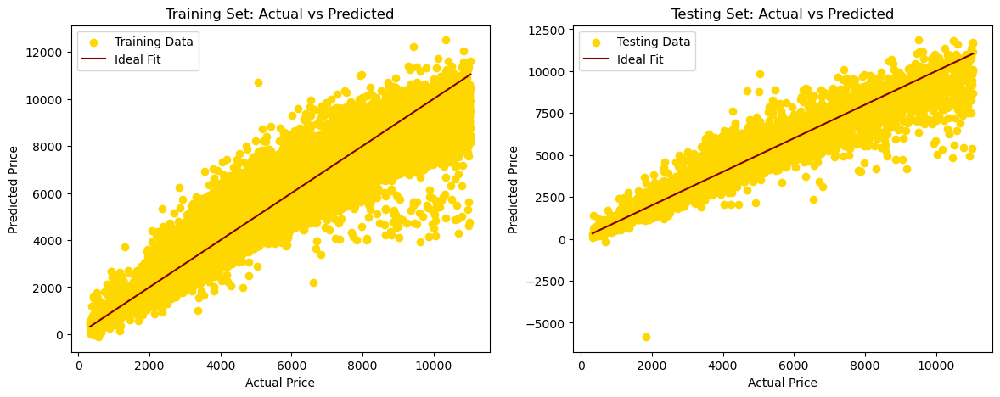

Polynomial Model (degree 3) R² (Train): 0.944
Polynomial Model (degree 3) R² (Test): 0.938
Difference between Train R² and Test R²: 0.005


In [36]:
x = diamonds.drop(['price'], axis=1)
y = diamonds['price']

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=42)

CVscores = {}

# Loop over degrees from 3 to 10
for degree in range(3, 6):
    poly = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    scores = cross_val_score(poly, x_train, y_train, cv=5, scoring='r2')
    CVscores[degree] = scores.mean()
    print(f"Polynomial Degree {degree} Cross-Validation R² Scores: {scores}")
    print(f"Mean Cross-Validation R² Score for Degree {degree}: {scores.mean()}")

# Find the best degree
bestdeg = max(CVscores, key=CVscores.get)
print(f"\nBest Polynomial Degree: {bestdeg} with Cross-Validation R² Score: {CVscores[bestdeg]}")

# Fit the best polynomial model on training data
bestpoly = make_pipeline(PolynomialFeatures(bestdeg), LinearRegression())
bestpoly.fit(x_train, y_train)

# Predictions
trainpoly = bestpoly.predict(x_train)
testpoly = bestpoly.predict(x_test)

# Plotting Predicted vs Actual values
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].scatter(y_train, trainpoly, color='gold', label='Training Data')
axes[0].plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='maroon', label='Ideal Fit')
axes[0].set_title('Training Set: Actual vs Predicted')
axes[0].set_xlabel('Actual Price')
axes[0].set_ylabel('Predicted Price')
axes[0].legend()

axes[1].scatter(y_test, testpoly, color='gold', label='Testing Data')
axes[1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='maroon', label='Ideal Fit')
axes[1].set_title('Testing Set: Actual vs Predicted')
axes[1].set_xlabel('Actual Price')
axes[1].set_ylabel('Predicted Price')
axes[1].legend()

plt.show()

# R² Scores
trainR2poly = r2_score(y_train, trainpoly)
testR2poly = r2_score(y_test, testpoly)
print(f"Polynomial Model (degree {bestdeg}) R² (Train): {np.round(trainR2poly, 3)}")
print(f"Polynomial Model (degree {bestdeg}) R² (Test): {np.round(testR2poly, 3)}")
print(f"Difference between Train R² and Test R²: {np.round((trainR2poly-testR2poly),3)}")

Polynomial Degree 3 Cross-Validation R² Scores: [0.73469628 0.91348674 0.91111779 0.90877567 0.8937723  0.75776964
 0.91600013 0.87405589 0.88757484 0.89011819]
Mean Cross-Validation R² Score for Degree 3: 0.8687367475712673
Polynomial Degree 4 Cross-Validation R² Scores: [-6.41539521e+01  9.18799824e-01  8.73089705e-01 -1.21426353e-01
 -2.51759710e+00 -1.07133696e+00  9.18998528e-01 -3.64947808e+02
  2.29556153e-01 -1.04740365e+00]
Mean Cross-Validation R² Score for Degree 4: -43.0919080190927
Polynomial Degree 5 Cross-Validation R² Scores: [-2.57411571e+03  9.23469137e-01  7.59947022e-01 -8.96832995e+01
 -3.72955952e+02 -6.36799827e+01  9.18915063e-01 -4.24538339e+04
 -6.23769832e+02 -3.29130858e+02]
Mean Cross-Validation R² Score for Degree 5: -4650.4567224109505

Best Polynomial Degree: 3 with Cross-Validation R² Score: 0.8687367475712673


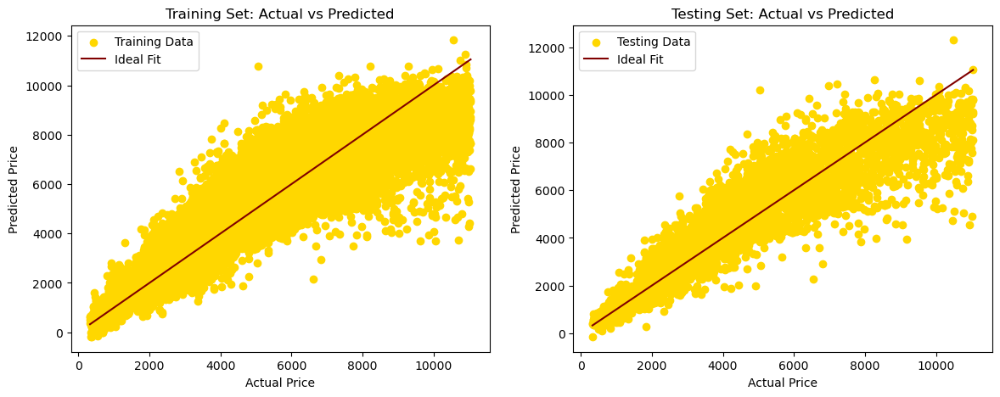

Polynomial Model (degree 3) R² (Train): 0.91
Polynomial Model (degree 3) R² (Test): 0.907
Difference between Train R² and Test R²: 0.003


In [37]:
selected =['carat', 'clarity', 'x', 'y', 'z', 'price']
data = diamonds[selected]
x = data.drop(['price'], axis=1)
y = data['price']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Dictionary to store cross-validation scores for each degree
CVscores = {}

# Loop over degrees from 3 to 10
for degree in range(3, 6):
    poly = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    scores = cross_val_score(poly, x_train, y_train, cv=10, scoring='r2')  # Cross-validation on training set
    CVscores[degree] = scores.mean()
    print(f"Polynomial Degree {degree} Cross-Validation R² Scores: {scores}")
    print(f"Mean Cross-Validation R² Score for Degree {degree}: {scores.mean()}")

# Find the best degree
bestdeg = max(CVscores, key=CVscores.get)
print(f"\nBest Polynomial Degree: {bestdeg} with Cross-Validation R² Score: {CVscores[bestdeg]}")

# Fit the best polynomial model on training data
bestpoly = make_pipeline(PolynomialFeatures(bestdeg), LinearRegression())
bestpoly.fit(x_train, y_train)

# Predictions
trainpoly = bestpoly.predict(x_train)
testpoly = bestpoly.predict(x_test)

# Plotting Predicted vs Actual values
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].scatter(y_train, trainpoly, color='gold', label='Training Data')
axes[0].plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='maroon', label='Ideal Fit')
axes[0].set_title('Training Set: Actual vs Predicted')
axes[0].set_xlabel('Actual Price')
axes[0].set_ylabel('Predicted Price')
axes[0].legend()

axes[1].scatter(y_test, testpoly, color='gold', label='Testing Data')
axes[1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='maroon', label='Ideal Fit')
axes[1].set_title('Testing Set: Actual vs Predicted')
axes[1].set_xlabel('Actual Price')
axes[1].set_ylabel('Predicted Price')
axes[1].legend()

plt.show()

# R² Scores
trainR2poly = r2_score(y_train, trainpoly)
testR2poly = r2_score(y_test, testpoly)
print(f"Polynomial Model (degree {bestdeg}) R² (Train): {np.round(trainR2poly, 3)}")
print(f"Polynomial Model (degree {bestdeg}) R² (Test): {np.round(testR2poly, 3)}")
print(f"Difference between Train R² and Test R²: {np.round((trainR2poly-testR2poly),3)}")

#### _In the context of Polynomial Regression, using all features, the Polynomial Model of degree 3 achieves the best performance with a Test R² of 0.938. When reducing the features to the top 5 selected based on ANOVA, the Test R² slightly decreases to 0.907. However, the Polynomial Model of degree 3 remains the best model in both scenarios. Despite the reduction in the number of features, the Polynomial Model with degree 3 consistently outperforms other models, demonstrating its robustness and effectiveness in capturing the underlying data patterns._


For the feature: carat, Linear Model
Linear Model R² (Train): 0.856
Linear Model R² (Test): 0.851
Difference between Train R² and Test R²: 0.005
Linear Model RMSE (T rain): 986.444
Linear Model RMSE (Test): 999.398

For the feature: carat, Degree: 3
Polynomial Model R² (Train): 0.867
Polynomial Model R² (Test): 0.861
Difference between Train R² and Test R²: 0.006
Polynomial Model RMSE (Train): 948.303
Polynomial Model RMSE (Test): 964.418

For the feature: carat, Degree: 4
Polynomial Model R² (Train): 0.867
Polynomial Model R² (Test): 0.861
Difference between Train R² and Test R²: 0.006
Polynomial Model RMSE (Train): 948.186
Polynomial Model RMSE (Test): 964.217

For the feature: carat, Degree: 5
Polynomial Model R² (Train): 0.867
Polynomial Model R² (Test): 0.861
Difference between Train R² and Test R²: 0.006
Polynomial Model RMSE (Train): 947.694
Polynomial Model RMSE (Test): 964.131

Best Degree for feature carat: 5 with CV R² Score: 0.8672974872226874


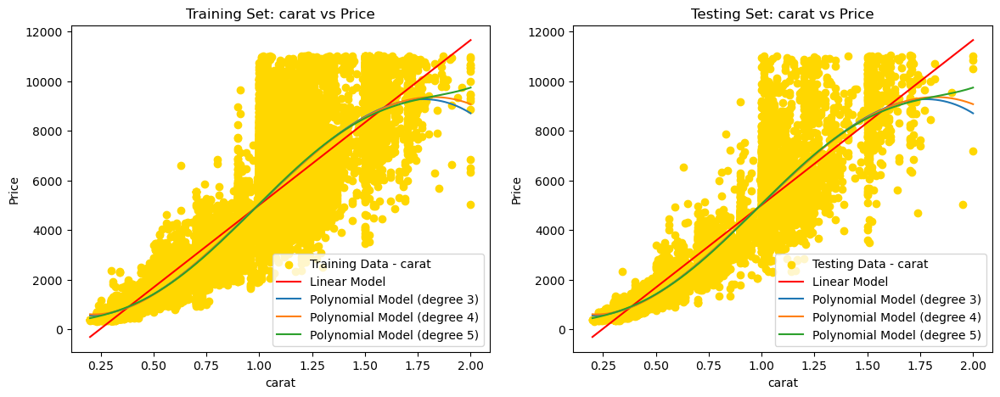


For the feature: cut, Linear Model
Linear Model R² (Train): 0.002
Linear Model R² (Test): 0.003
Difference between Train R² and Test R²: -0.001
Linear Model RMSE (T rain): 2599.465
Linear Model RMSE (Test): 2584.31

For the feature: cut, Degree: 3
Polynomial Model R² (Train): 0.009
Polynomial Model R² (Test): 0.008
Difference between Train R² and Test R²: 0.001
Polynomial Model RMSE (Train): 2591.197
Polynomial Model RMSE (Test): 2577.752

For the feature: cut, Degree: 4
Polynomial Model R² (Train): 0.011
Polynomial Model R² (Test): 0.01
Difference between Train R² and Test R²: 0.001
Polynomial Model RMSE (Train): 2588.009
Polynomial Model RMSE (Test): 2574.793

For the feature: cut, Degree: 5
Polynomial Model R² (Train): 0.011
Polynomial Model R² (Test): 0.01
Difference between Train R² and Test R²: 0.001
Polynomial Model RMSE (Train): 2588.014
Polynomial Model RMSE (Test): 2574.749

Best Degree for feature cut: 4 with CV R² Score: 0.010709065418809848


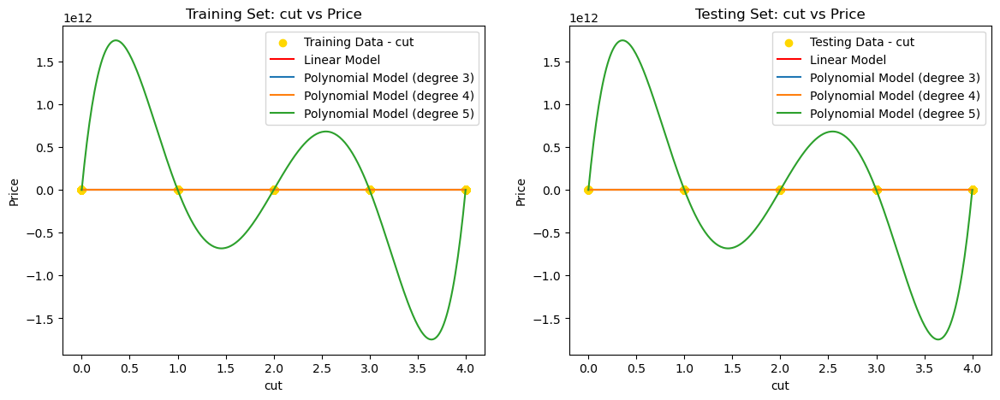


For the feature: color, Linear Model
Linear Model R² (Train): 0.021
Linear Model R² (Test): 0.02
Difference between Train R² and Test R²: 0.001
Linear Model RMSE (T rain): 2574.558
Linear Model RMSE (Test): 2561.877

For the feature: color, Degree: 3
Polynomial Model R² (Train): 0.022
Polynomial Model R² (Test): 0.021
Difference between Train R² and Test R²: 0.001
Polynomial Model RMSE (Train): 2574.285
Polynomial Model RMSE (Test): 2561.489

For the feature: color, Degree: 4
Polynomial Model R² (Train): 0.022
Polynomial Model R² (Test): 0.022
Difference between Train R² and Test R²: 0.0
Polynomial Model RMSE (Train): 2573.685
Polynomial Model RMSE (Test): 2560.165

For the feature: color, Degree: 5
Polynomial Model R² (Train): 0.022
Polynomial Model R² (Test): 0.022
Difference between Train R² and Test R²: 0.0
Polynomial Model RMSE (Train): 2573.331
Polynomial Model RMSE (Test): 2559.773

Best Degree for feature color: 5 with CV R² Score: 0.0218079790509339


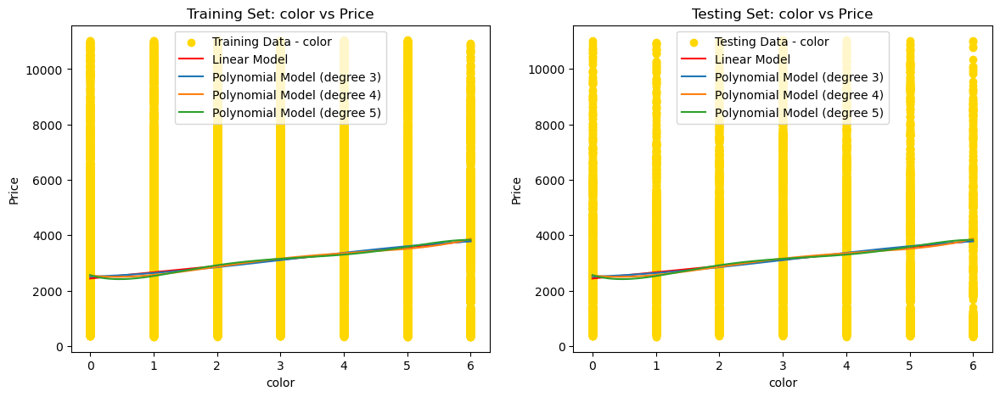


For the feature: clarity, Linear Model
Linear Model R² (Train): 0.006
Linear Model R² (Test): 0.006
Difference between Train R² and Test R²: -0.0
Linear Model RMSE (T rain): 2595.165
Linear Model RMSE (Test): 2580.696

For the feature: clarity, Degree: 3
Polynomial Model R² (Train): 0.016
Polynomial Model R² (Test): 0.013
Difference between Train R² and Test R²: 0.002
Polynomial Model RMSE (Train): 2581.916
Polynomial Model RMSE (Test): 2570.791

For the feature: clarity, Degree: 4
Polynomial Model R² (Train): 0.024
Polynomial Model R² (Test): 0.021
Difference between Train R² and Test R²: 0.003
Polynomial Model RMSE (Train): 2571.541
Polynomial Model RMSE (Test): 2561.074

For the feature: clarity, Degree: 5
Polynomial Model R² (Train): 0.024
Polynomial Model R² (Test): 0.022
Difference between Train R² and Test R²: 0.002
Polynomial Model RMSE (Train): 2570.651
Polynomial Model RMSE (Test): 2559.607

Best Degree for feature clarity: 5 with CV R² Score: 0.023855123418091838


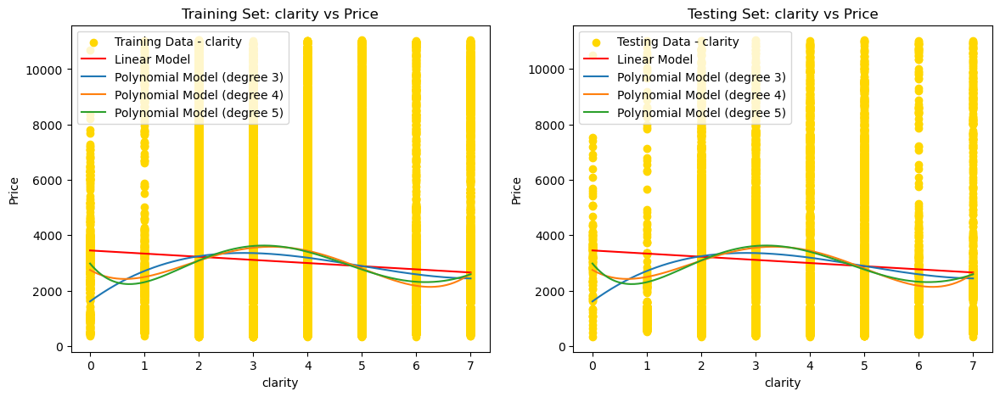


For the feature: depth, Linear Model
Linear Model R² (Train): 0.0
Linear Model R² (Test): 0.0
Difference between Train R² and Test R²: 0.0
Linear Model RMSE (T rain): 2602.332
Linear Model RMSE (Test): 2588.199

For the feature: depth, Degree: 3
Polynomial Model R² (Train): 0.003
Polynomial Model R² (Test): 0.004
Difference between Train R² and Test R²: -0.0
Polynomial Model RMSE (Train): 2598.09
Polynomial Model RMSE (Test): 2583.356

For the feature: depth, Degree: 4
Polynomial Model R² (Train): 0.004
Polynomial Model R² (Test): 0.003
Difference between Train R² and Test R²: 0.0
Polynomial Model RMSE (Train): 2597.626
Polynomial Model RMSE (Test): 2583.821

For the feature: depth, Degree: 5
Polynomial Model R² (Train): 0.005
Polynomial Model R² (Test): 0.004
Difference between Train R² and Test R²: 0.001
Polynomial Model RMSE (Train): 2596.511
Polynomial Model RMSE (Test): 2583.374

Best Degree for feature depth: 5 with CV R² Score: 0.004036160129454558


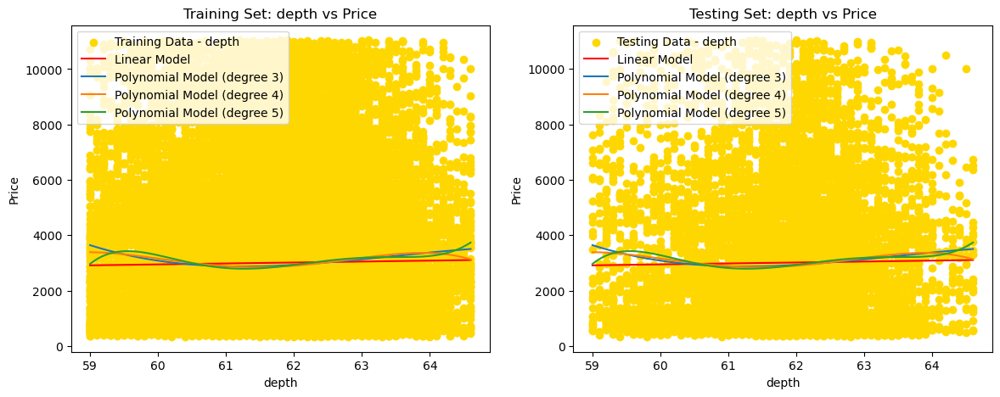


For the feature: table, Linear Model
Linear Model R² (Train): 0.019
Linear Model R² (Test): 0.023
Difference between Train R² and Test R²: -0.004
Linear Model RMSE (T rain): 2577.966
Linear Model RMSE (Test): 2558.901

For the feature: table, Degree: 3
Polynomial Model R² (Train): 0.022
Polynomial Model R² (Test): 0.024
Difference between Train R² and Test R²: -0.002
Polynomial Model RMSE (Train): 2573.721
Polynomial Model RMSE (Test): 2556.49

For the feature: table, Degree: 4
Polynomial Model R² (Train): 0.023
Polynomial Model R² (Test): 0.026
Difference between Train R² and Test R²: -0.003
Polynomial Model RMSE (Train): 2572.137
Polynomial Model RMSE (Test): 2554.456

For the feature: table, Degree: 5
Polynomial Model R² (Train): 0.024
Polynomial Model R² (Test): 0.025
Difference between Train R² and Test R²: -0.002
Polynomial Model RMSE (Train): 2571.812
Polynomial Model RMSE (Test): 2555.085

Best Degree for feature table: 5 with CV R² Score: 0.02316854161485309


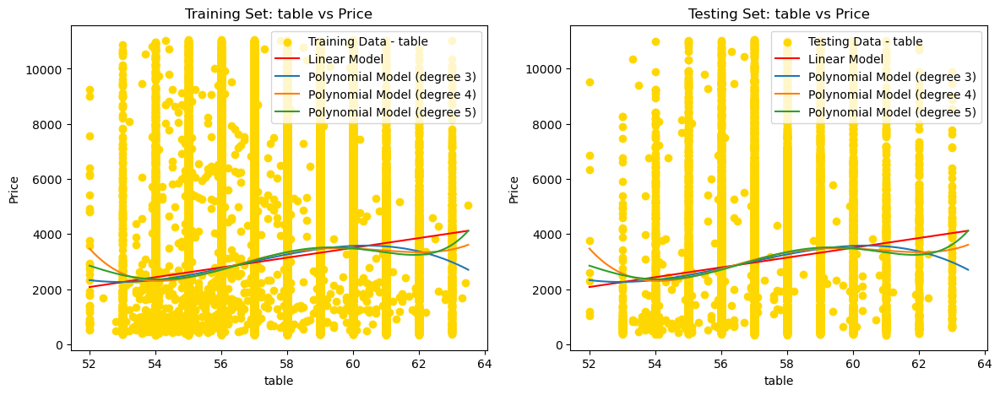


For the feature: x, Linear Model
Linear Model R² (Train): 0.818
Linear Model R² (Test): 0.812
Difference between Train R² and Test R²: 0.006
Linear Model RMSE (T rain): 1109.069
Linear Model RMSE (Test): 1121.061

For the feature: x, Degree: 3
Polynomial Model R² (Train): 0.865
Polynomial Model R² (Test): 0.857
Difference between Train R² and Test R²: 0.007
Polynomial Model RMSE (Train): 957.574
Polynomial Model RMSE (Test): 977.438

For the feature: x, Degree: 4
Polynomial Model R² (Train): 0.866
Polynomial Model R² (Test): 0.859
Difference between Train R² and Test R²: 0.007
Polynomial Model RMSE (Train): 951.43
Polynomial Model RMSE (Test): 971.807

For the feature: x, Degree: 5
Polynomial Model R² (Train): 0.866
Polynomial Model R² (Test): 0.859
Difference between Train R² and Test R²: 0.007
Polynomial Model RMSE (Train): 951.401
Polynomial Model RMSE (Test): 971.774

Best Degree for feature x: 5 with CV R² Score: 0.8662923866038232


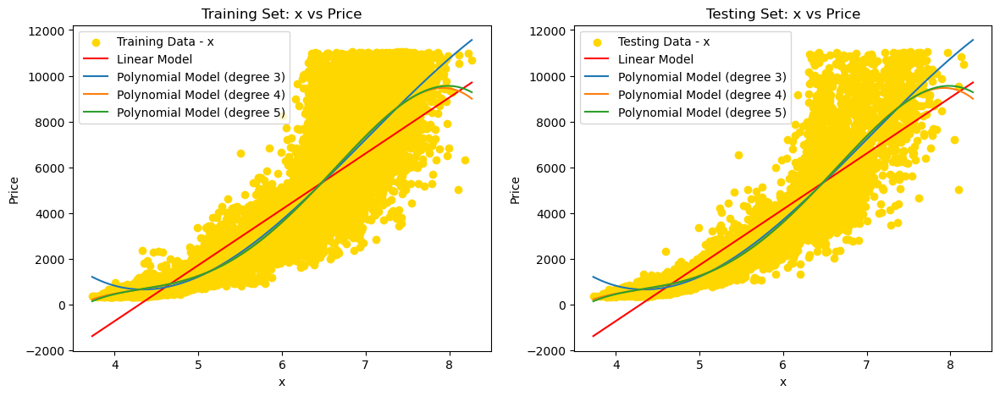


For the feature: y, Linear Model
Linear Model R² (Train): 0.82
Linear Model R² (Test): 0.815
Difference between Train R² and Test R²: 0.005
Linear Model RMSE (T rain): 1103.603
Linear Model RMSE (Test): 1114.186

For the feature: y, Degree: 3
Polynomial Model R² (Train): 0.869
Polynomial Model R² (Test): 0.863
Difference between Train R² and Test R²: 0.006
Polynomial Model RMSE (Train): 940.403
Polynomial Model RMSE (Test): 958.213

For the feature: y, Degree: 4
Polynomial Model R² (Train): 0.871
Polynomial Model R² (Test): 0.865
Difference between Train R² and Test R²: 0.007
Polynomial Model RMSE (Train): 933.81
Polynomial Model RMSE (Test): 952.1

For the feature: y, Degree: 5
Polynomial Model R² (Train): 0.871
Polynomial Model R² (Test): 0.865
Difference between Train R² and Test R²: 0.007
Polynomial Model RMSE (Train): 933.795
Polynomial Model RMSE (Test): 952.063

Best Degree for feature y: 5 with CV R² Score: 0.87118440280189


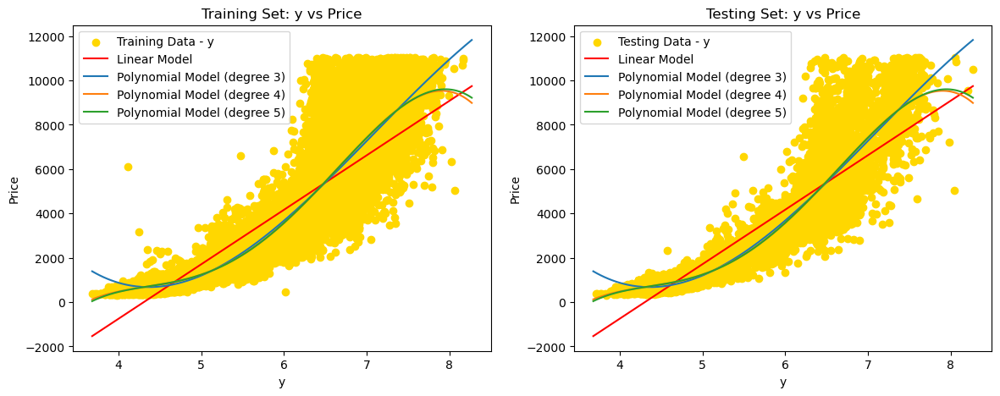


For the feature: z, Linear Model
Linear Model R² (Train): 0.812
Linear Model R² (Test): 0.809
Difference between Train R² and Test R²: 0.003
Linear Model RMSE (T rain): 1127.727
Linear Model RMSE (Test): 1131.92

For the feature: z, Degree: 3
Polynomial Model R² (Train): 0.86
Polynomial Model R² (Test): 0.855
Difference between Train R² and Test R²: 0.005
Polynomial Model RMSE (Train): 975.231
Polynomial Model RMSE (Test): 986.089

For the feature: z, Degree: 4
Polynomial Model R² (Train): 0.861
Polynomial Model R² (Test): 0.856
Difference between Train R² and Test R²: 0.005
Polynomial Model RMSE (Train): 971.376
Polynomial Model RMSE (Test): 981.693

For the feature: z, Degree: 5
Polynomial Model R² (Train): 0.862
Polynomial Model R² (Test): 0.856
Difference between Train R² and Test R²: 0.005
Polynomial Model RMSE (Train): 967.892
Polynomial Model RMSE (Test): 981.131

Best Degree for feature z: 5 with CV R² Score: 0.8615455437826262


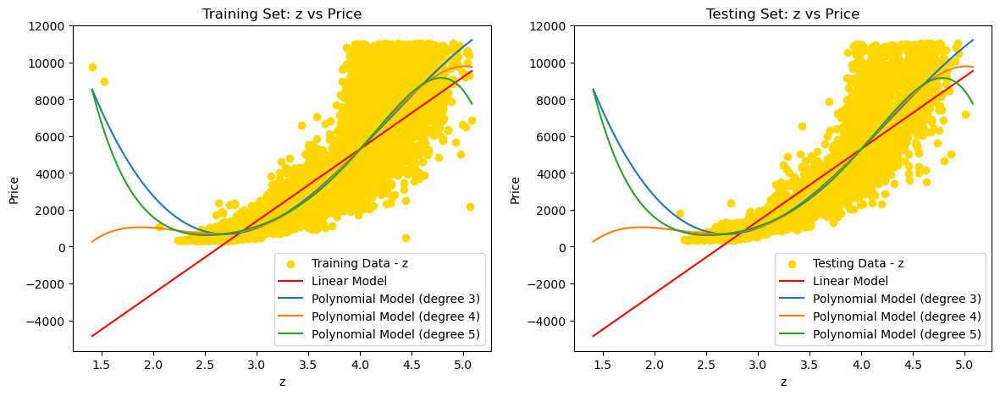

In [38]:
results = []

# Iterate over the features in diamonds except 'price'
for feature in diamonds.drop(columns=['price']).columns:
    x = diamonds[feature].values.reshape(-1, 1)
    y = diamonds['price'].values.reshape(-1, 1)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    # Linear Regression
    linear = LinearRegression()
    linear.fit(x_train, y_train)
    trainpredlin = linear.predict(x_train)
    testpredlin = linear.predict(x_test)

    # Calculate R² and RMSE for linear model
    trainR2lin = r2_score(y_train, trainpredlin)
    testR2lin = r2_score(y_test, testpredlin)
    trainRMSElin = mean_squared_error(y_train, trainpredlin, squared=False)  
    testRMSElin = mean_squared_error(y_test, testpredlin, squared=False)    
    
    # Append linear model results
    results.append({
        'Feature': feature,
        'Degree': 'Linear',
        'Train R²': trainR2lin,
        'Test R²': testR2lin,
        'Train RMSE': trainRMSElin,
        'Test RMSE': testRMSElin
    })

    print(f"\nFor the feature: {feature}, Linear Model")
    print(f"Linear Model R² (Train): {np.round(trainR2lin,3)}")
    print(f"Linear Model R² (Test): {np.round(testR2lin,3)}")
    print(f"Difference between Train R² and Test R²: {np.round((trainR2lin-testR2lin),3)}")
    print(f"Linear Model RMSE (T rain): {np.round(trainRMSElin,3)}")
    print(f"Linear Model RMSE (Test): {np.round(testRMSElin,3)}")
    
    CVscores = {}
    bestdeg = 'Linear'
    bestR2 = testR2lin 
    
    # Plot setup
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Prepare data for smooth curve
    xsmoothlin = np.linspace(x.min(), x.max(), 300).reshape(-1, 1)
    ysmoothlin = linear.predict(xsmoothlin)
    
    # Scatter plot for training data
    axes[0].scatter(x_train, y_train, color='gold', label=f'Training Data - {feature}')
    axes[0].plot(xsmoothlin, ysmoothlin, color='red', label='Linear Model')

    # Scatter plot for testing data
    axes[1].scatter(x_test, y_test, color='gold', label=f'Testing Data - {feature}')
    axes[1].plot(xsmoothlin, ysmoothlin, color='red', label='Linear Model')

    for degree in range(3, 6):
        # Polynomial Regression
        polyfeatures = PolynomialFeatures(degree=degree)
        xtrainpoly = polyfeatures.fit_transform(x_train)
        xtestpoly = polyfeatures.transform(x_test)
        poly = LinearRegression()
        
        # Cross-validation
        pipeline = make_pipeline(PolynomialFeatures(degree), LinearRegression())
        scores = cross_val_score(pipeline, x_train, y_train, cv=5, scoring='r2')
        CVscores[degree] = scores.mean()
        
        if CVscores[degree] > bestR2:
            bestR2 = CVscores[degree]
            bestdeg = degree
        
        # Fit polynomial model
        poly.fit(xtrainpoly, y_train)
        trainpoly = poly.predict(xtrainpoly)
        testpoly = poly.predict(xtestpoly)
        
        xsmoothpoly = polyfeatures.transform(xsmoothlin)
        ysmoothpoly = poly.predict(xsmoothpoly)
        
        # Plot polynomial model
        axes[0].plot(xsmoothlin, ysmoothpoly, label=f'Polynomial Model (degree {degree})')
        axes[1].plot(xsmoothlin, ysmoothpoly, label=f'Polynomial Model (degree {degree})')
        
        # R² and RMSE Scores
        trainR2poly = r2_score(y_train, trainpoly)
        testR2poly = r2_score(y_test, testpoly)
        trainRMSEpoly = mean_squared_error(y_train, trainpoly, squared=False)  # RMSE
        testRMSEpoly = mean_squared_error(y_test, testpoly, squared=False)    # RMSE
        
        print(f"\nFor the feature: {feature}, Degree: {degree}")
        print(f"Polynomial Model R² (Train): {np.round(trainR2poly,3)}")
        print(f"Polynomial Model R² (Test): {np.round(testR2poly,3)}")
        print(f"Difference between Train R² and Test R²: {np.round((trainR2poly-testR2poly),3)}")
        print(f"Polynomial Model RMSE (Train): {np.round(trainRMSEpoly,3)}")
        print(f"Polynomial Model RMSE (Test): {np.round(testRMSEpoly,3)}")
        
        results.append({
            'Feature': feature,
            'Degree': degree,
            'Train R²': trainR2poly,
            'Test R²': testR2poly,
            'Train RMSE': trainRMSEpoly,
            'Test RMSE': testRMSEpoly
        })

    print(f"\nBest Degree for feature {feature}: {bestdeg} with CV R² Score: {CVscores.get(bestdeg, bestR2)}")
    
    axes[0].set_title(f'Training Set: {feature} vs Price')
    axes[0].set_xlabel(f'{feature}')
    axes[0].set_ylabel('Price')
    axes[0].legend()

    axes[1].set_title(f'Testing Set: {feature} vs Price')
    axes[1].set_xlabel(f'{feature}')
    axes[1].set_ylabel('Price')
    axes[1].legend()

    plt.show()

DiamondResults = pd.DataFrame(results)

#### _When selecting only a single feature, the Polynomial Model of degree 5 performs best with the features carat, x, y, and z. The other features do not yield good performance. This indicates that among the individual features, carat, x, y, and z are the most predictive when used in a Polynomial Model of degree 5, while the other features do not contribute significantly to the model's performance._

In [39]:
DiamondResults

,Feature,Degree,Train R²,Test R²,Train RMSE,Test RMSE
0,carat,Linear,0.856341,0.850908,986.444278,999.397921
1,carat,3,0.867236,0.861162,948.302671,964.417681
2,carat,4,0.867269,0.861220,948.186034,964.216665
3,carat,5,0.867406,0.861245,947.694186,964.131486
4,cut,Linear,0.002403,0.003067,2599.465326,2584.309786
5,cut,3,0.008740,0.008120,2591.196670,2577.751614
6,cut,4,0.011177,0.010396,2588.009385,2574.792906
7,cut,5,0.011173,0.010429,2588.014373,2574.749330
8,color,Linear,0.021429,0.020299,2574.558297,2561.877011
9,color,3,0.021637,0.020596,2574.284964,2561.488984


### 3.3 Decision Tree Regressor <a class="anchor" id="sec33"></a>

In [40]:
selected =['carat', 'clarity', 'x', 'y', 'z', 'price']
data = diamonds[selected]
X = data.drop(['price'], axis=1)
y = data['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [41]:
hyperparams = {
    'max_depth': [7, 8, 9],
    'min_samples_split': [10, 12, 14],
    'min_samples_leaf':[10, 12, 14]
}

DTR = DecisionTreeRegressor(random_state=42)

GSCV = GridSearchCV(DTR, hyperparams, cv=10, scoring='r2')
# fitting on the TRAINING SET
GSCV.fit(X_train, y_train)

print("Best values for hyperparameters:", GSCV.best_params_)

Best values for hyperparameters: {'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 10}


In [42]:
bestDTR = GSCV.best_estimator_

trainpred = bestDTR.predict(X_train)
testpred = bestDTR.predict(X_test)

trainR2 = r2_score(y_train, trainpred)
testR2 = r2_score(y_test, testpred)

trainMSE = mean_squared_error(y_train, trainpred)
testMSE = mean_squared_error(y_test, testpred)

print(f"\nTrain R²: {trainR2:.4f}")
print(f"Test R²: {testR2:.4f}")
print(f"Difference between Train R² and Test R²: {trainR2-testR2:.4f}")

print(f"Train RMSE: {trainMSE:.4f}")
print(f"Test RMSE: {testMSE:.4f}")


Train R²: 0.9466
Test R²: 0.9423
Difference between Train R² and Test R²: 0.0043
Train RMSE: 361807.9765
Test RMSE: 386617.4841


In [43]:
plt.figure(figsize=(40, 20), dpi = 600)
plot_tree(bestDTR, feature_names=list(X.columns), filled=True, rounded=True, max_depth=4, fontsize=10)
plt.title("Decision Tree Regression", fontsize=10)
plt.show()

#### _The above tree only shows the first 4 levels._

### 3.4 Random Forest Regressor <a class="anchor" id="sec34"></a>

In [44]:
hyperparams = {
    'n_estimators': [50, 100],
    'max_depth': [10, 15],
    'min_samples_split': [10, 12, 14],
    'min_samples_leaf': [10, 15, 20]
}

RFR = RandomForestRegressor(random_state=42)

GSCV = GridSearchCV(RFR, hyperparams, cv=10, scoring='r2', n_jobs=1)
# fitting on the TRAINING SET
GSCV.fit(X_train, y_train)

print("Best value for hyperparameters:", GSCV.best_params_)

Best value for hyperparameters: {'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 100}


In [45]:
bestRFR = GSCV.best_estimator_

trainpred = bestRFR.predict(X_train)
testpred = bestRFR.predict(X_test)

trainR2 = r2_score(y_train, trainpred)
testR2 = r2_score(y_test, testpred)

trainMSE = mean_squared_error(y_train, trainpred)
testMSE = mean_squared_error(y_test, testpred)

print(f"Train R²: {trainR2:.4f}")
print(f"Test R²: {testR2:.4f}")
print(f"Difference between Train R² and Test R²: {trainR2-testR2:.4f}")

print(f"Train RMSE: {trainMSE:.4f}")
print(f"Test RMSE: {testMSE:.4f}")

Train R²: 0.9521
Test R²: 0.9446
Difference between Train R² and Test R²: 0.0075
Train RMSE: 324205.6027
Test RMSE: 370890.5183


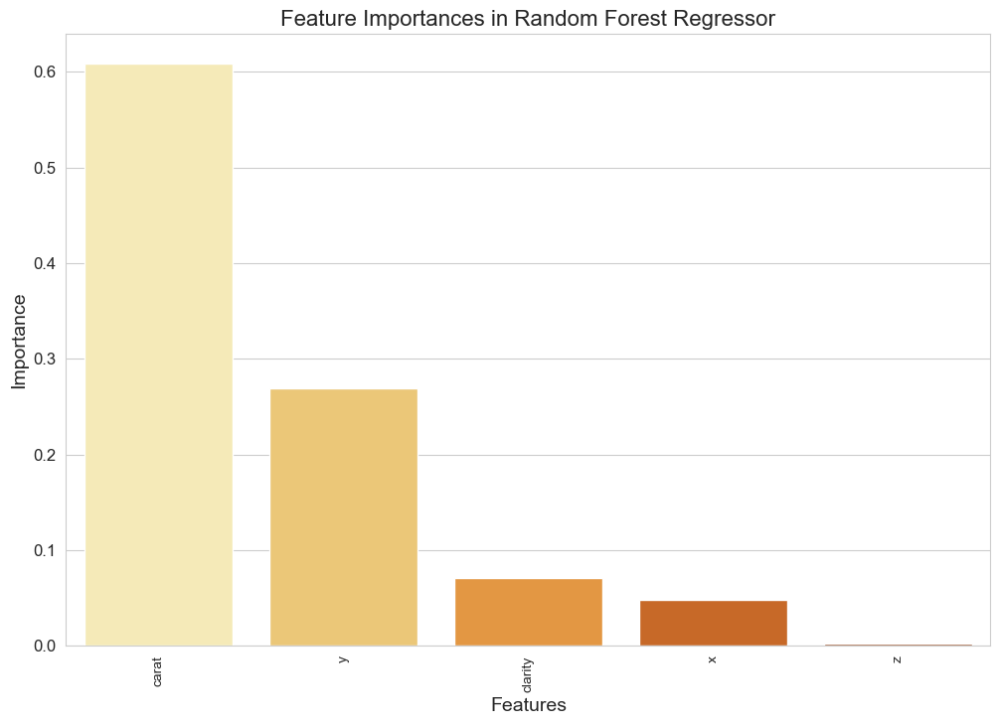

In [46]:
plt.figure(figsize=(12, 8))
sns.set_style("whitegrid")
features = sorted(zip(bestRFR.feature_importances_, X.columns), reverse=True)

sns.barplot(x=[x[1] for x in features], y=[x[0] for x in features], palette="YlOrBr")

plt.title("Feature Importances in Random Forest Regressor", fontsize=16)
plt.xlabel("Features", fontsize=14)
plt.ylabel("Importance", fontsize=14)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=12)
plt.show()

### 3.5 Regularization Methods <a class="anchor" id="sec35"></a>

#### 3.5.1 L-1 Regularization (Lasso) <a class="anchor" id="sec351"></a>

In [47]:
X = diamonds.drop(['price'], axis=1)
y = diamonds['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
train_scaled = scaler.fit_transform(X_train)
test_scaled = scaler.transform(X_test)

In [48]:
# Lasso regression
lasso = Lasso()

# Hyperparameter tuning using GridSearchCV
params = {'alpha': np.logspace(-6, 6, 10)}
lassoCV = GridSearchCV(lasso, params, cv=10, scoring='r2')
lassoCV.fit(train_scaled, y_train)

# Best hyperparameter
print("Best alpha(lambda) for Lasso:", lassoCV.best_params_['alpha'])

# Train the model with the best hyperparameter
bestlasso = Lasso(alpha=lassoCV.best_params_['alpha'])
bestlasso.fit(train_scaled, y_train)

Best alpha(lambda) for Lasso: 0.01


Lasso(alpha=0.01)

In [49]:
testlasso = bestlasso.predict(test_scaled)
testlassoMSE = mean_squared_error(y_test, testlasso)
testlassoR2 = r2_score(y_test, testlasso)

trainlasso = bestlasso.predict(train_scaled)
trainlassoMSE = mean_squared_error(y_train, trainlasso)
trainlassoR2 = r2_score(y_train, trainlasso)

print(f"Train MSE: {trainlassoMSE}")
print(f"Train R²: {trainlassoR2}")
print(f"Test MSE: {testlassoMSE}")
print(f"Test R²: {testlassoR2}")
print(f"Difference between Train R² and Test R²: {trainlassoR2-testlassoR2:.4f}")

Train MSE: 732526.6003605733
Train R²: 0.8918540476032513
Test MSE: 746137.4244485408
Test R²: 0.8886229548554234
Difference between Train R² and Test R²: 0.0032


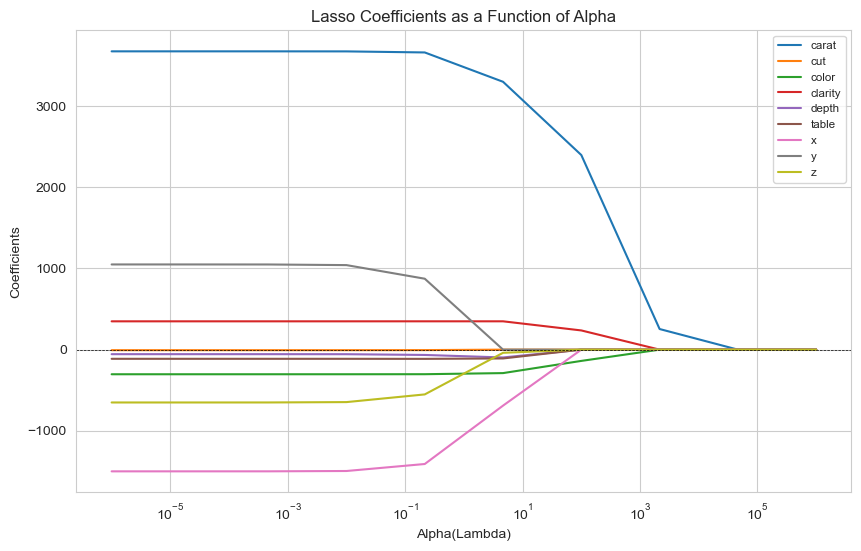

In [50]:
# Effect of alpha on coefficients
alphas = np.logspace(-6, 6, 10)
coefs = []
features = diamonds.drop(columns=['price']).columns

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(train_scaled, y_train)
    coefs.append(lasso.coef_)

plt.figure(figsize=(10, 6))

for i in range(train_scaled.shape[1]):
    plt.plot(alphas, [coef[i] for coef in coefs], label=features[i])

plt.xscale('log')
plt.xlabel('Alpha(Lambda)')
plt.ylabel('Coefficients')
plt.title('Lasso Coefficients as a Function of Alpha')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
plt.legend(fontsize='small')
plt.show()

#### - _As alpha (λ) increases, some coefficients shrink to exactly zero, effectively performing feature selection. This means Lasso Regression can completely eliminate some features from the model._
#### - _Lasso eliminates less important features as alpha increases, making the model simpler and more interpretable. For instance, coefficients for features like "depth" and "table" become zero at higher alpha values, indicating they are not as influential as other features._
#### - _By setting some coefficients to zero, Lasso Regression simplifies the model, which can improve interpretability and potentially enhance generalization by focusing only on the most significant features._

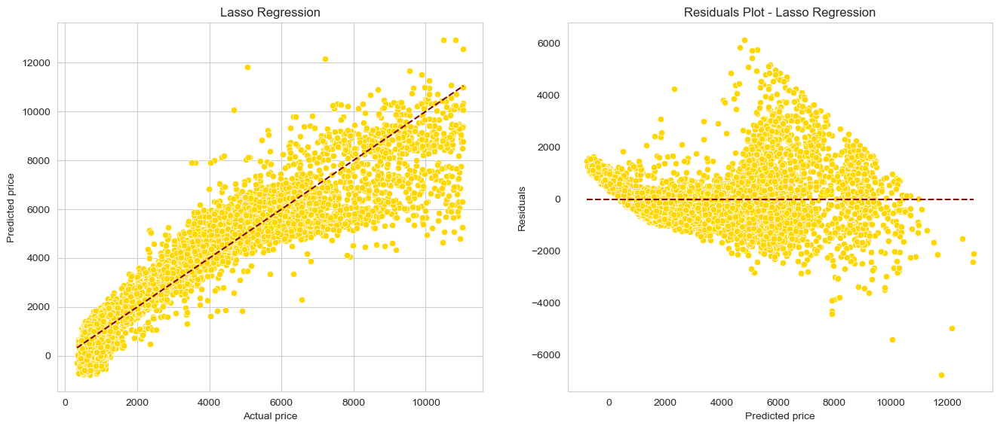

In [51]:
plt.figure(figsize=(16, 14))
plt.subplot(2, 2, 1)
sns.scatterplot(x=y_test, y=testlasso, color='gold')
sns.lineplot(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], color='maroon', linestyle='--')
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Lasso Regression')
plt.grid(True)

residuals = y_test - testlasso
plt.subplot(2, 2, 2)
sns.scatterplot(x=testlasso, y=residuals, color='gold')
plt.hlines(0, min(testlasso), max(testlasso), colors='maroon', linestyles='--')
plt.xlabel('Predicted price')
plt.ylabel('Residuals')
plt.title('Residuals Plot - Lasso Regression')
plt.grid()

plt.show()

#### 3.5.1 L-2 Regularization (Ridge) <a class="anchor" id="sec352"></a>

In [52]:
# Ridge regression
ridge = Ridge()

# Hyperparameter tuning using GridSearchCV
params = {'alpha': np.logspace(-6, 6, 10)}
ridgeCV = GridSearchCV(ridge, params, cv=10, scoring='r2')
ridgeCV.fit(train_scaled, y_train)

# Best hyperparameter
print("Best alpha(lambda) for Ridge:", ridgeCV.best_params_['alpha'])

# Train the model with the best hyperparameter
bestridge = Ridge(alpha=ridgeCV.best_params_['alpha'])
bestridge.fit(train_scaled, y_train)

Best alpha(lambda) for Ridge: 4.641588833612772


Ridge(alpha=4.641588833612772)

In [53]:
testridge = bestridge.predict(test_scaled)
testridgeMSE = mean_squared_error(y_test, testridge)
testridgeR2 = r2_score(y_test, testridge)

trainridge = bestridge.predict(train_scaled)
trainridgeMSE = mean_squared_error(y_train, trainridge)
trainridgeR2 = r2_score(y_train, trainridge)

print(f"Train MSE: {trainridgeMSE}")
print(f"Train R²: {trainridgeR2}")
print(f"Test MSE: {testridgeMSE}")
print(f"Test R²: {testridgeR2}")
print(f"Difference between Train R² and Test R²: {trainridgeR2-testridgeR2:.4f}")

Train MSE: 732544.3309876343
Train R²: 0.8918514299569444
Test MSE: 746303.4869569544
Test R²: 0.8885981664573477
Difference between Train R² and Test R²: 0.0033


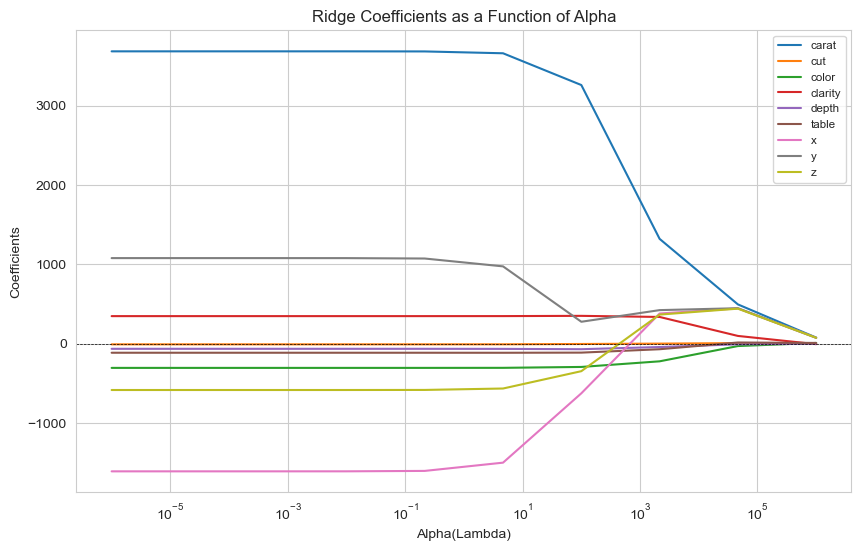

In [54]:
# Effect of lambda on coefficients
alphas = np.logspace(-6, 6, 10)
coefs = []
features = diamonds.drop(columns=['price']).columns

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(train_scaled, y_train)
    coefs.append(ridge.coef_)

plt.figure(figsize=(10, 6))

for i in range(train_scaled.shape[1]):
    plt.plot(alphas, [coef[i] for coef in coefs], label=features[i])
    
plt.xscale('log')
plt.xlabel('Alpha(Lambda)')
plt.ylabel('Coefficients')
plt.title('Ridge Coefficients as a Function of Alpha')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
plt.legend(fontsize='small')

plt.show()


#### - _As alpha (λ) increases, the coefficients of all features shrink towards zero but do not actually become zero. This indicates that Ridge Regression is effective in reducing the magnitude of the coefficients without eliminating any features entirely._
#### - _Different features shrink at different rates, which reflects their varying importance and sensitivity to regularization. For example, the coefficient for "carat" (blue line) starts very high and decreases significantly with increasing alpha, indicating its strong initial influence on the model which diminishes with regularization_.
#### - _By shrinking coefficients, Ridge Regression helps to reduce overfitting, especially for those features that have high multicollinearity. It retains all features in the model, thereby maintaining the overall complexity but with reduced individual feature influence._


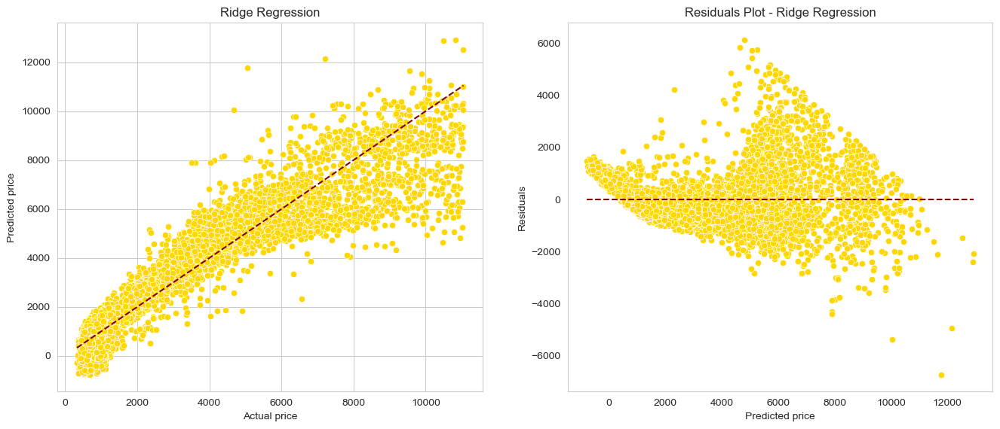

In [55]:
plt.figure(figsize=(16, 14))
plt.subplot(2, 2, 1)
sns.scatterplot(x=y_test, y=testridge, color='gold')
sns.lineplot(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], color='maroon', linestyle='--')
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Ridge Regression')
plt.grid(True)

residuals = y_test - testridge
plt.subplot(2, 2, 2)
sns.scatterplot(x=testridge, y=residuals, color='gold')
plt.hlines(0, min(testridge), max(testridge), colors='maroon', linestyles='--')
plt.xlabel('Predicted price')
plt.ylabel('Residuals')
plt.title('Residuals Plot - Ridge Regression')
plt.grid()
plt.show()

In [56]:
# Compare the results of Ridge and Lasso
comparison = pd.DataFrame({
    'Model': ['Ridge', 'Lasso'],
    'MSE': [testridgeMSE, testlassoMSE],
    'R2': [testridgeR2, testlassoR2],
    'Best Alpha': [ridgeCV.best_params_['alpha'], lassoCV.best_params_['alpha']]
})

comparison

,Model,MSE,R2,Best Alpha
0,Ridge,746303.486957,0.888598,4.641589
1,Lasso,746137.424449,0.888623,0.010000


In [57]:
print("Best alpha(lambda) for Ridge:", ridgeCV.best_params_['alpha'])
print("Best alpha(lambda) for Lasso:", lassoCV.best_params_['alpha'])

Best alpha(lambda) for Ridge: 4.641588833612772
Best alpha(lambda) for Lasso: 0.01


In [58]:
# Display the comparison of actual vs predicted outputs
outputs = pd.DataFrame({
    'Actual': y_test,
    'Ridge Predicted': testridge,
    'Lasso Predicted': testlasso
})
outputs

,Actual,Ridge Predicted,Lasso Predicted
21681,9784,6980.645750,6980.513361
619,2839,2777.023260,2772.035067
3578,3420,3389.903908,3389.184897
7639,4267,4176.568922,4175.632503
31772,773,623.617036,620.569865
...,...,...,...
51674,2398,3133.001923,3132.856183
17655,7114,5752.722352,5753.233340
45294,1662,2032.140844,2029.967666
22689,629,27.177216,27.065178


In [59]:
rcoefs = bestridge.coef_
lcoefs = bestlasso.coef_
features = diamonds.drop(columns=['price']).columns

In [60]:
coefs = pd.DataFrame({
    'Features': features,
    'Ridge Coefficients': rcoefs,
    'Lasso Coefficients': lcoefs
})

coefs

,Features,Ridge Coefficients,Lasso Coefficients
0,carat,3659.353036,3674.377035
1,cut,-6.255310,-6.424950
2,color,-302.737992,-303.221013
3,clarity,348.913501,348.856254
4,depth,-64.103406,-56.239871
5,table,-113.004854,-112.961167
6,x,-1497.044200,-1495.162328
7,y,975.296190,1041.441015
8,z,-563.200822,-646.302290


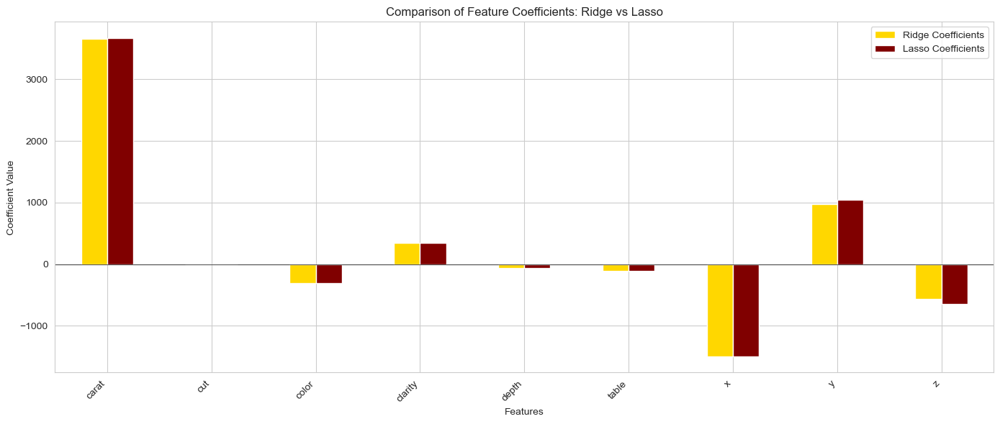

In [61]:
coefs = coefs.set_index('Features')
coefs.plot(kind='bar', figsize=(14, 6), color=['gold', 'maroon'])
plt.title('Comparison of Feature Coefficients: Ridge vs Lasso')
plt.xlabel('Features')
plt.ylabel('Coefficient Value')
plt.legend(['Ridge Coefficients', 'Lasso Coefficients'])
plt.axhline(0, color='black', linewidth=0.5)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### - _There are slight differences in the magnitudes of the coefficients between Ridge and Lasso, but they generally align in direction and relative importance._
#### - _Both methods indicate that "carat" is the most important feature._
#### - _Both methods show consistent signs (positive or negative) for each feature, indicating agreement on the direction of their impacts._
#### - _For features like "depth" and "table," both methods indicate minimal impact, suggesting they are less critical in predicting the target variable._

### 3.6 Neural Networks <a class="anchor" id="sec36"></a>

#### 3.6.1 Multi-Layer Perceptron Regressor <a class="anchor" id="sec361"></a>

In [62]:
X = diamonds.drop(['price'], axis=1)
y = diamonds['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
train_scaled = scaler.fit_transform(X_train)
test_scaled = scaler.transform(X_test)

In [63]:
"""
hidden_layer_sizes: Various configurations for the number and size of hidden layers.
activation: Activation functions to use (tanh and relu).
alpha: L2 penalty (regularization term) parameter.
learning_rate: Learning rate schedule (constant and adaptive).
max_iter: Maximum number of iterations.
learning_rate_init: Initial learning rate.
solver: Solver for weight optimization (lbfgs, sgd, and adam).
"""

hyperparams = {
    'hidden_layer_sizes':
    [(50,), (100,), (200,), (50, 50) ,(50,100), (100,50), (50, 100, 100), (100, 100, 50)],
    'activation': ['tanh', 'relu'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant', 'adaptive'],
    'max_iter': [50, 100, 500, 1000],
    'learning_rate_init': [0.0001, 0.001, 0.01, 0.1],
    'solver': ['lbfgs', 'sgd', 'adam']
}

In [64]:
MLP = MLPRegressor()
optimalMLP = RandomizedSearchCV(MLP, param_distributions=hyperparams, n_iter=10, cv=5,
                                 scoring='r2', n_jobs=-1,random_state=42)

In [65]:
optimalMLP.fit(X=train_scaled, y=y_train)

/Users/khushigandhi/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/Users/khushigandhi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_base.py:173: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Users/khushigandhi/anaconda3/lib/python3.11/site-packages/sklearn/utils/extmath.py:193: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/khushigandhi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_base.py:128: RuntimeWarning: invalid value encountered in multiply
  delta *= 1 - Z**2
/Users/khushigandhi/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/Users/khushigandhi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_base.py:173: Runt

RandomizedSearchCV(cv=5, estimator=MLPRegressor(), n_jobs=-1,
                   param_distributions={'activation': ['tanh', 'relu'],
                                        'alpha': [0.0001, 0.05],
                                        'hidden_layer_sizes': [(50,), (100,),
                                                               (200,), (50, 50),
                                                               (50, 100),
                                                               (100, 50),
                                                               (50, 100, 100),
                                                               (100, 100, 50)],
                                        'learning_rate': ['constant',
                                                          'adaptive'],
                                        'learning_rate_init': [0.0001, 0.001,
                                                               0.01, 0.1],
                                        'max_iter': [50, 100, 500, 1000],
                                        'solver': ['lbfgs', 'sgd', 'adam']},
                   random_state=42, scoring='r2')

In [66]:
print("Best parameters: ")
pd.DataFrame(optimalMLP.best_params_)

Best parameters: 


,solver,max_iter,learning_rate_init,learning_rate,hidden_layer_sizes,alpha,activation
0,lbfgs,1000,0.0001,adaptive,50,0.0001,relu
1,lbfgs,1000,0.0001,adaptive,100,0.0001,relu
2,lbfgs,1000,0.0001,adaptive,100,0.0001,relu


In [67]:
trainpred = optimalMLP.predict(train_scaled)
testpred = optimalMLP.predict(test_scaled)

In [68]:
trainMLPMSE = mean_squared_error(y_train, trainpred)
trainMLPR2 = r2_score(y_train, trainpred)
print(f"Train MSE: {np.round(trainMLPMSE,3)}")
print(f"Train R²: {np.round(trainMLPR2,3)}")

testMLPMSE = mean_squared_error(y_test, testpred)
testMLPR2 = r2_score(y_test, testpred)
print(f"Test MSE: {np.round(testMLPMSE,3)}")
print(f"Test R²: {np.round(testMLPR2,3)}")

Train MSE: 105523.796
Train R²: 0.984
Test MSE: 115437.966
Test R²: 0.983


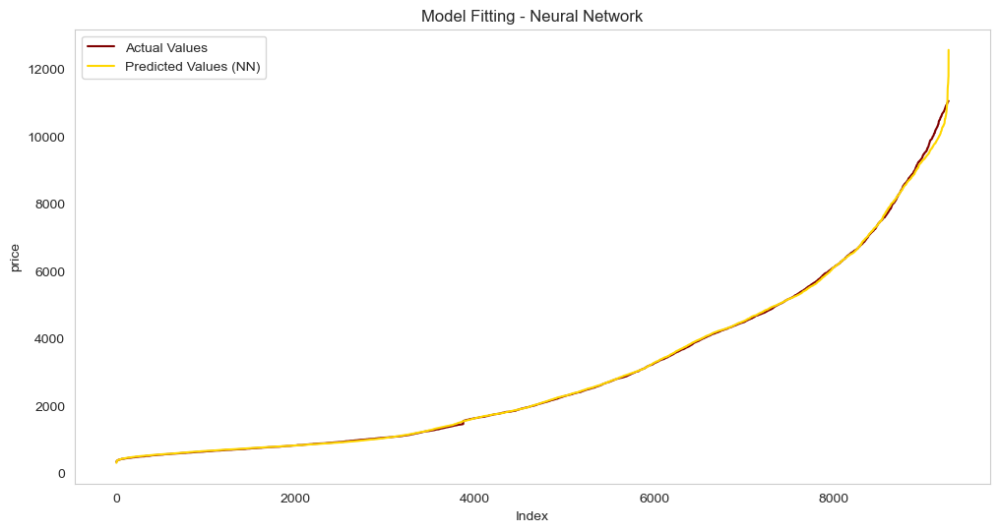

In [69]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=np.arange(len(y_test)), y=np.sort(y_test), label='Actual Values', color='maroon')
sns.lineplot(x=np.arange(len(testpred)), y=np.sort(testpred), label='Predicted Values (NN)', color='gold')
plt.xlabel('Index')
plt.ylabel('price')
plt.title('Model Fitting - Neural Network')
plt.legend()
plt.grid()

plt.show()


Neural Network Regression Train - MSE: 105523.79580464472, R²: 0.984

Neural Network Regression Test - MSE: 115437.96630810223, R²: 0.983


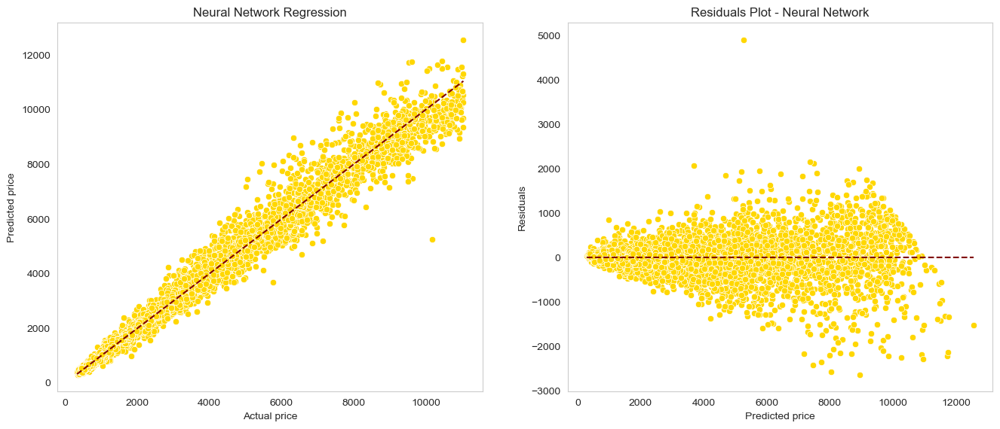

In [70]:
print(f'\nNeural Network Regression Train - MSE: {trainMLPMSE}, R²: {np.round(trainMLPR2,3)}')
print(f'\nNeural Network Regression Test - MSE: {testMLPMSE}, R²: {np.round(testMLPR2,3)}')
plt.figure(figsize=(16, 14))
plt.subplot(2, 2, 1)
sns.scatterplot(x=y_test, y=testpred, color='gold')
sns.lineplot(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], color='maroon', linestyle='--')
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Neural Network Regression')
plt.grid()

# Residuals plot for Neural Network
residuals = y_test - testpred
plt.subplot(2, 2, 2)
sns.scatterplot(x=testpred, y=residuals, color='gold')
plt.hlines(0, min(testpred), max(testpred), colors='maroon', linestyles='--')
plt.xlabel('Predicted price')
plt.ylabel('Residuals')
plt.title('Residuals Plot - Neural Network')
plt.grid()
plt.show()